# 量子コンピュータを用いた組合せ最適化

第二回の講義で、イジング模型の結合定数を学習することで、入力データを記憶させたり、確率分布を学習させたりすることができることを学びました。ボルツマンモデルの場合は、可視ノードと隠れノードの間にしか相互作用がない（２部グラフ）のイジング模型になっているため、サンプリングが高速にできました。しかし、一般にイジング模型が与えられた時に、その基底状態の配位を見つけることは難しい（NP困難）問題です。厳密に基底状態を見つけるのは最悪の場合、問題のサイズに対して指数関数的な計算量が必要となるため、近似的なアプローチ（ヒューリスティクス）を用いることになります（メトロポリス・ヘイスティングス法も近似手法の１つです）。

量子コンピュータを用いたヒューリスティクスとして、量子アニーリング（断熱量子計算）やQAOA（Quantum Approximated Optimization Algorithm）があります。

## ■断熱操作
ハミルトニアンの固有状態
$$
H| E\rangle = E |E\rangle
$$
に対して、ハミルトニアンによる時間発展を作用させても、位相因子がつくだけで状態は時間発展しません。
$$
e^{ - i H t} |E\rangle = e^{- i E t} |E\rangle 
$$

この時、ハミルトニアンを徐々に変化
$$
H(s) = (1-s) H_1 + s H_2
$$
のようにsを0から1まで変化させるさせると、初期状態が$s=0$のハミルトニアン$H_1$の固有状態であれば、
$s=1$の終状態のハミルトニアンの固有状態へと変換されます。このように常に時間的に変化する固有状態に固定されたまま変化する操作を、断熱操作と呼びます。

以下では、1量子ビットの最もシンプルなモデル
$$
 H(s) = (1-s)Z + s X
$$
を例に、断熱操作をシミュレーションしてみましょう。

まず、$|0\rangle$は$s=0$の(+1の固有値を持つ)固有状態です。それに対して、$s=1$では$|+\rangle = (|0\rangle + |1\rangle )/\sqrt{2}$が固有状態になります。
一般の$s$に対しては上記の$H(s)$を対角化することで、
$$
|E(s)_{\pm}\rangle = \cos \left( \dfrac{\theta}{2} \right ) |0\rangle \pm \sin \left( \dfrac{\theta}{2} \right ) |1\rangle
$$
ただし、
$$
\cos \theta = \frac{1 - s}{\sqrt{(1 - s)^2 + s^2}}, \quad \sin \theta = \frac{s}{\sqrt{(1 - s)^2 + s^2}}, 
\\
\theta = \arctan \left( \dfrac{s}{1 - s} \right ).
$$
固有値は、
$$
\lambda_{\pm} = \pm \sqrt{ (1 - s)^2 + s^2 } = \pm \sqrt{ 1 - 2s + 2s^2 }
$$
となります。以下では、ゆっくりと$s$を変化させることで断熱的に量子状態が操作できるかどうか確かめてみましょう。

まずはパウリ演算子と量子状態を `numpy` を用いて定義します。



In [99]:
import numpy as np
import matplotlib.pyplot as plt


# パウリ行列の定義
X = np.array([[0, 1],
              [1, 0]], dtype=complex)
Z = np.array([[1, 0],
              [0, -1]], dtype=complex)

# 初期状態 |0>
psi0 = np.array([1, 0], dtype=complex)

次に、時間に依存した時間発展のシミュレーションを計算します。時間に依存したハミルトニアンの時間発展はここでは時間を細かく $\Delta t$ に区切る（トロッター分割）ことによってその$\Delta t$の間は時間に依存しないハミルトニアンダイナミクス
$$
U =  e^{-i H(s_{ N_{\rm step}} ) \Delta t  } \cdots  e^{-i H(s _k ) \Delta t  } \cdots  e^{-i H(s _1 ) \Delta t  }
$$
（ただし、$s_k$は$k$番目の区間での$s$の値）を用いて計算をすることにします。行列の指数関数は `scipy.linalg expm` を用います。各時刻での固有状態は、`eig`を用います。

In [101]:
from scipy.linalg import expm , eig

# 時間発展の関数
def time_evolution(T_total, N_steps):
    dt = T_total / N_steps
    psi = psi0.copy()
    psi_list = [psi0]
    psi_gs_list = [psi0]
    t_list = [0]
    fidelity_list = [1]  # 初期状態と基底状態は一致

    for n in range(1, N_steps + 1):
        t = n * dt
        s = t / T_total
        H = (1 - s) * Z + s * X

        # 時間発展演算子の計算
        U = expm(-1j * H * dt)
        psi = U @ psi
        psi_list.append(psi)
        t_list.append(t)

        # 瞬間的な固有状態の計算
        eigenvalues, eigenvectors = eig(H)
        idx = eigenvalues.real.argmax()  # 最大の固有値（基底状態）のインデックス
        psi_gs = eigenvectors[:, idx]
        psi_gs_list.append(psi_gs)

        # 位相を調整（フィデリティは位相の差を除いて計算）
        overlap = np.vdot(psi_gs, psi)
        fidelity = np.abs(overlap)**2 / (np.linalg.norm(psi_gs)**2 * np.linalg.norm(psi)**2)
        fidelity_list.append(fidelity)

    return np.array(t_list), np.array(psi_list), np.array(fidelity_list), np.array(psi_gs_list)

上記の時間発展を用いて時間発展させ、各時刻での状態$|\psi (t)\rangle$とその自国での$s$の値で定義される固有状態$|E(s)\rangle$との内積の絶対値の２乗
$$
F= |\langle \psi (t) | E(s) \rangle |^2
$$
を忠実度（いかに目的の状態に近いかという指標）としてプロットしてみます。

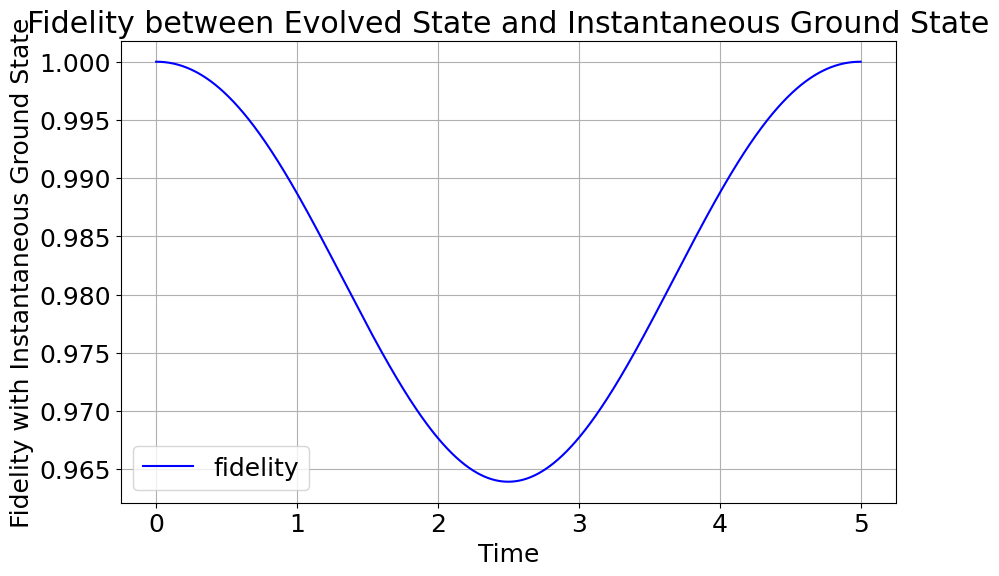

In [102]:
# 断熱的な時間発展
T_total = 5  # 断熱的（ゆっくり）
N_steps = 1000
t, psi, fidelity, psi_gs = time_evolution(T_total, N_steps)


# 結果のプロット
plt.figure(figsize=(10, 6))
plt.plot(t, fidelity, label='fidelity', color='blue')

plt.xlabel('Time')
plt.ylabel('Fidelity with Instantaneous Ground State')
plt.title('Fidelity between Evolved State and Instantaneous Ground State')
plt.legend()
plt.grid(True)
plt.show()


時間を短く取り断熱条件が破れるようにすると、大きく忠実度が低下することがわかります。
最後に状態を可視化してみましょう。

In [103]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
from IPython.display import HTML

# ブロッホ球上の座標への変換
def bloch_coords(psi_list):
    x_list = []
    y_list = []
    z_list = []

    for psi in psi_list:
        # 正規化
        psi = psi / np.linalg.norm(psi)

        # ブロッホベクトルの計算
        a, b = psi[0], psi[1]
        x = 2 * np.real(np.conj(a) * b)
        y = 2 * np.imag(np.conj(a) * b)
        z = np.abs(a)**2 - np.abs(b)**2

        x_list.append(x)
        y_list.append(y)
        z_list.append(z)

    return x_list, y_list, z_list


# ダウンサンプリング
sampling_rate = 20
psi_downsampled = psi[::sampling_rate]

x_list, y_list, z_list = bloch_coords(psi_downsampled)

# ブロッホ球の描画とアニメーションの設定
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

# ブロッホ球のプロット
u = np.linspace(0, 2 * np.pi, 100)
v = np.linspace(0, np.pi, 100)
X_sphere = np.outer(np.cos(u), np.sin(v))
Y_sphere = np.outer(np.sin(u), np.sin(v))
Z_sphere = np.outer(np.ones(np.size(u)), np.cos(v))
ax.plot_surface(X_sphere, Y_sphere, Z_sphere, rstride=1, cstride=1, color='white',
                edgecolor='grey', linewidth=0.6, alpha=1, zorder=1)

# 初期状態のプロット
point, = ax.plot([x_list[0]], [y_list[0]], [z_list[0]], 'o', color='r', markersize=10, zorder=5)

# 軸の設定
ax.set_xlim([-1, 1])
ax.set_ylim([-1, 1])
ax.set_zlim([-1, 1])
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Quantum State Evolution on the Bloch Sphere')


# 視点の設定
ax.view_init(elev=35.264, azim=45)

# アニメーションの更新関数
def update(num, x_list, y_list, z_list, point):
    point.set_data([x_list[num]], [y_list[num]])
    point.set_3d_properties(z_list[num])
    return point,

# アニメーションの作成
ani = animation.FuncAnimation(fig, update, frames=len(x_list), fargs=(x_list, y_list, z_list, point),
                              interval=50, blit=False)
plt.close(fig)  # 不要な静止画の表示を防ぐ





# アニメーションを表示
HTML(ani.to_jshtml())







## ■ 量子アニーリング（断熱量子計算）

量子アニーリングは、上記の断熱操作を利用して、初期状態は自明に用意できる状態のハミルトニアンに設定し、基底状態を見つけるのが難しいハミルトニアンに徐々にハミルトニアンを変化させることでイジング模型の基底状態を求める手法です。断熱量子計算とも呼ばれます。基底状態を見つけたいハミルトニアンを、問題ハミルトニアンと呼び、イジング模型を用いて以下のように定義します：
$$
H_{\rm prob} = \sum _{ij} J_{ij} Z_i Z_j + \sum _i h_i Z_i
$$
ここで、$Z_i$は$i$番目の量子ビットに作用するパウリ演算子です。（第二回の授業では古典の２値変数を用いましたが、量子ビット扱うために、固有値が+1と-1の値を取るパウリ演算子でイジングスピンを表現します）

パウリZ演算子は対角行列なので、$|00>$や$|01>$といったビット列に対応した状態（重ね合わせのない状態）が固有状態になります。
例えば、２量子ビットに作用する$Z_1 Z_2$の行列要素は、
$$
\left(
\begin{array}{cc}
1 & 0 
\\
0 & -1
\end{array}
\right)
\otimes 
\left(
\begin{array}{cc}
1 & 0 
\\
0 & -1
\end{array}
\right)
=
\left(
\begin{array}{cccc}
1 & 0 & 0 & 0
\\
0 & -1 & 0 & 0
\\
0 & 0 &-1 & 0
\\
0 & 0 & 0 & 1
\end{array}
\right)
\begin{array}{c}
\leftarrow |00\rangle
\\
\leftarrow |01\rangle
\\
\leftarrow |10\rangle
\\
\leftarrow |11\rangle
\end{array}
$$
となり、$|01\rangle, |10\rangle$の状態が低いエネルギー$-1$を持つ。つまり向きが逆になったほうが安定となります。（古典スピンの場合と同様）

問題ハミルトニアン以外に、初期状態を準備しやすいハミルトニアンも定義しましょう。ここでは横磁場のハミルトニアン
$$
H_{\rm x} = - \sum_i X_i
$$
を考えます。係数に$-1$がついているのでパウリ演算子$X$の固有状態$|+\rangle=\frac{1}{\sqrt{2}}(|0\rangle + |1\rangle)$の直積状態$|+\rangle |+\rangle  \cdots |+\rangle $ 、つまり全ての組み合わせパターンが重ね合わさった状態が最低エネルギーの固有状態となっています。

この２つのハミルトニアンを用いて、量子アニーリングを以下のハミルトニアンを用いて実行してみましょう：
$$
 H = (1-s) H_X + s H_{\rm prob}
$$

## ■ Qulacsを用いた量子コンピュータのシミュレーション

シミュレーションには量子コンピュータのシミュレーターである `qulacs` を用います。まず、`qulacs`を用いた必要最低限のシミュレーションについて説明します。

In [70]:
from qulacs import QuantumState
from qulacs import QuantumCircuit
from qulacs.gate import Identity, X,Y,Z #パウリ演算子
from qulacs.gate import H,S,Sdag, sqrtX,sqrtXdag,sqrtY,sqrtYdag #1量子ビット Clifford演算
from qulacs.gate import T,Tdag #1量子ビット 非Clifford演算
from qulacs.gate import RX,RY,RZ #パウリ演算子についての回転演算
from qulacs.gate import CNOT, CZ, SWAP #2量子ビット演算
from qulacs.gate import U1,U2,U3 #IBM Gate
from qulacs import Observable

def show_distribution(state):
    nqubits = state.get_qubit_count()
    plt.bar([i for i in range(pow(2,nqubits))],pow(abs(state.get_vector()),2), tick_label=[bin(i) for i in range(pow(2,nqubits))])
    plt.xticks(rotation=90)
    plt.show()

def show_observable(hamiltonian):
    for j in range(hamiltonian.get_term_count()):
        pauli=hamiltonian.get_term(j)

        # Get the subscript of each pauli symbol
        index_list = pauli.get_index_list()

        # Get pauli symbols (I,X,Y,Z -> 0,1,2,3)
        pauli_id_list = pauli.get_pauli_id_list()

        # Get pauli coefficient
        coef = pauli.get_coef()

        # Create a copy of pauli operator
        another_pauli = pauli.copy()

        s = ["I","X","Y","Z"]
        pauli_str = [s[i] for i in pauli_id_list]
        terms_str = [item[0]+str(item[1]) for item in zip(pauli_str,index_list)]
        full_str = str(coef) + " " + " ".join(terms_str)
        print(full_str)

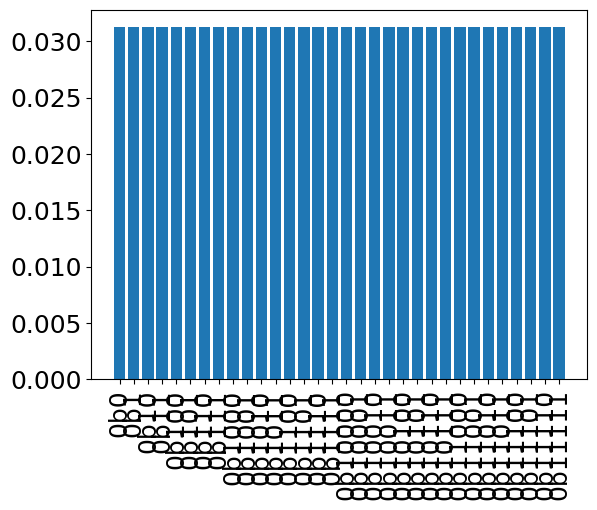

In [104]:
nqubits = 5
##量子状態の確保（初期状態は全部ゼロの状態、|00...0>）
state = QuantumState(nqubits)

##状態に量子ゲートを作用させる
for i in range(nqubits):
    H(i).update_quantum_state(state)

##確率分布（複素確率振幅ではない）を表示
show_distribution(state)






### QuantumStateクラス：量子状態の取扱

- 量子状態の確保
- 初期化：`set_zero_state()`
- 状態ベクトルをarrayとして書き出し：`get_vecot()`
- 状態のコピー：`copy()`
- 計算基底でのサンプリング：`sampling()`

### 量子ビットの確保

In [106]:
from qulacs import QuantumState
nqubits = 3
state = QuantumState(nqubits)

また、確保した量子ビットをすべて0状態、$|00...0\rangle$へと初期化は `set_zero_state()`で行うことができる。

In [107]:
state.set_zero_state()

### 状態ベクトルを `array` として書き出し
量子状態を取得し、`array`として格納するには、`get_vector()`を使う。

In [108]:
state_array = state.get_vector()
print(state_array)

[1.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j]


逆に`array`から状態をロードすることも可能

In [109]:
my_vector = [ 1.2345 for i in range(2**nqubits)]
state.load(my_vector)
print(state)

 *** Quantum State ***
 * Qubit Count : 3
 * Dimension   : 8
 * State vector : 
(1.2345,0)
(1.2345,0)
(1.2345,0)
(1.2345,0)
(1.2345,0)
(1.2345,0)
(1.2345,0)
(1.2345,0)



### 特殊な初期状態の指定
ゼロ状態への初期化以外にも、ビット列を指定した初期化、`set_computational_basis()`、や、ランダムな量子状態の準備、`set_Haar_random_state()`、などの準備を行う関数も用意されている。

In [113]:
state.set_computational_basis(0b101)
print(state)

 *** Quantum State ***
 * Qubit Count : 3
 * Dimension   : 8
 * State vector : 
(0,0)
(0,0)
(0,0)
(0,0)
(0,0)
(1,0)
(0,0)
(0,0)



ランダムな量子状態を準備することも可能。

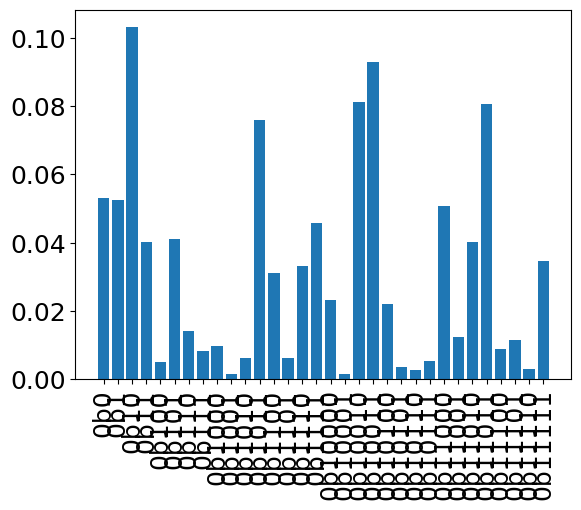

In [123]:
seed = 0
nqubits = 5
state = QuantumState(nqubits)
state.set_Haar_random_state(seed)
show_distribution(state)

### 計算基底でのサンプリング
`sampling(shots)` で `shots` 回の計算基底でのサンプリングを実行できる。実行結果はサンプリング結果のビット列を整数化（001なら、1、101なら5など）したリストとして得られる。

In [124]:
shots = 10
state.sampling(shots)

[0, 0, 19, 14, 2, 5, 2, 15, 0, 27]

　量子状態のために確保したメモリの解放は、`del`から行うことができる。

In [121]:
del state
state

NameError: name 'state' is not defined

### 状態のコピーと内積
qulacsには他にも、量子状態のコピーや、

In [125]:
state = QuantumState(nqubits)
copied_state = state.copy()

２つの量子状態の内積の計算、

In [126]:
from qulacs.state import inner_product
inner_product(copied_state,state)
#同じ状態の内積なので1になる。

(1+0j)

### 物理量（observable）の定義と期待値の評価
パウリ演算子の和として物理量を定義することができる

In [127]:
nqubits = 5
operator = Observable(nqubits)
operator.add_operator(1.0,"Z 0 Z 1 ")
operator.add_operator(1.0,"Z 1 Z 2 ")
operator.add_operator(1.0,"X 0 ")
operator.add_operator(1.0,"X 1 ")
operator.add_operator(1.0,"X 2 ")

show_observable(operator)

(1+0j) Z0 Z1
(1+0j) Z1 Z2
(1+0j) X0
(1+0j) X1
(1+0j) X2


物理量（エルミート演算子$O$）に対する期待値の評価$\langle \psi |O|\psi \rangle$：

In [128]:
state = QuantumState(nqubits)
operator.get_expectation_value(state)

2.0

### 量子演算とその実行
- 様々な量子演算
- 量子演算による状態の更新：`update_quantum_state()`


量子演算の生成は、`gate`に関するモジュールを用いて実行する。パウリ演算やアダマール演算、CNOT演算など、よく使う基本演算はあらかじめ定義されている。また、自分で定義した配列から、量子演算を生成することもできる

In [129]:
from qulacs import QuantumState
from qulacs.gate import Identity, X,Y,Z #パウリ演算子
from qulacs.gate import H,S,Sdag, sqrtX,sqrtXdag,sqrtY,sqrtYdag #1量子ビット Clifford演算
from qulacs.gate import T,Tdag #1量子ビット 非Clifford演算
from qulacs.gate import RX,RY,RZ #パウリ演算子についての回転演算
from qulacs.gate import CNOT, CZ, SWAP #2量子ビット演算

`Identity` $=
\left(
\begin{array}{cc}
1 & 0
\\
0 & 1
\end{array}
\right)$, 
`X` $= \left(
\begin{array}{cc}
0 & 1
\\
1 & 0
\end{array}
\right)
$, 
`Y` $=
\left(
\begin{array}{cc}
0 & -i
\\
i & 0
\end{array}
\right)
$, 
`Z` $=
\left(
\begin{array}{cc}
1 & 0
\\
0 & -1
\end{array}
\right)
$, 


`H` $=
\frac{1}{\sqrt{2}}\left(
\begin{array}{cc}
1 & 1
\\
1 & -1
\end{array}
\right)
$, 
`S` $=
\left(
\begin{array}{cc}
1 & 0
\\
0 & i
\end{array}
\right)
$,
`Sdag` $=
\frac{1}{\sqrt{2}}\left(
\begin{array}{cc}
1 & 0
\\
0 & -i
\end{array}
\right)
$,


`sqrtX` $=\sqrt{X}=
\frac{1}{2}\left(
\begin{array}{cc}
1+i & 1-i
\\
1-i & 1+i
\end{array}
\right)
$, 
`sqrtXdag` $=\sqrt{X}^{\dagger}=
\frac{1}{2}\left(
\begin{array}{cc}
1-i & 1+i
\\
1+i & 1-i
\end{array}
\right)
$, 

`sqrtY` $=\sqrt{Y}=
\frac{1}{2}\left(
\begin{array}{cc}
1+i & -1-i
\\
1+i & 1+i
\end{array}
\right)
$, 
`sqrtYdag` $=\sqrt{Y}^{\dagger}=
\frac{1}{2}\left(
\begin{array}{cc}
1-i & -1+i
\\
1-i & 1-i
\end{array}
\right)
$

`T` 
$= 
\left(
\begin{array}{cc}
1 & 0
\\
0 & e^{i \pi/4}
\end{array}
\right)
$, 
`Tdag` 
$=\left(
\begin{array}{cc}
1 & 0
\\
0 & e^{-i \pi/4}
\end{array}
\right)
$

`RX` $= e^{i (\theta/2) X}$, `RY` $= e^{i (\theta/2) Y}$, `RZ` $= e^{i (\theta/2) Z}$

`CNOT` $= \left(
\begin{array}{cccc}
    1 & 0& 0& 0
    \\
    0 & 1& 0& 0
    \\
    0 & 0& 0& 1
    \\
    0 & 0& 1& 0    
\end{array}
\right)
$,
`CZ` $= \left(
\begin{array}{cccc}
    1 & 0& 0& 0
    \\
    0 & 1& 0& 0
    \\
    0 & 0& 1& 0
    \\
    0 & 0& 0& -1    
\end{array}
\right)
$,
`SWAP` $= \left(
\begin{array}{cccc}
    1 & 0& 0& 0
    \\
    0 & 0& 1& 0
    \\
    0 & 1& 0& 0
    \\
    0 & 0& 0& 1    
\end{array}
\right)
$

他にも、多体のパウリ演算、`Pauli`、多体パウリ演算による回転、`PauliRotation`、IBMQで利用されている`U1`,`U2`,`U3`演算や、測定、`Measurement`、ノイズ（確率的な演算）、 `BitFlipNoise`、`DephasingNoise`、 `IndepenedentXZNoise`、`DepolarizingNoise`なども用意されている。これらの事前に定義された演算に対して、量子ビットのインデックスや、回転演算の角度など必要な情報を引数として指定することによってが`gate`が生成される。生成された演算を状態に作用させ状態`state`を更新するときは、`gate.update_quantum_state(state)`が利用できる。

[1.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j]
[0.+0.j 1.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j]
[0.+0.j 0.+0.j 0.+0.j 1.+0.j 0.+0.j 0.+0.j 0.+0.j 0.+0.j]
[0.        +0.j 0.        +0.j 0.        +0.j 0.70710678+0.j
 0.        +0.j 0.        +0.j 0.        +0.j 0.70710678+0.j]


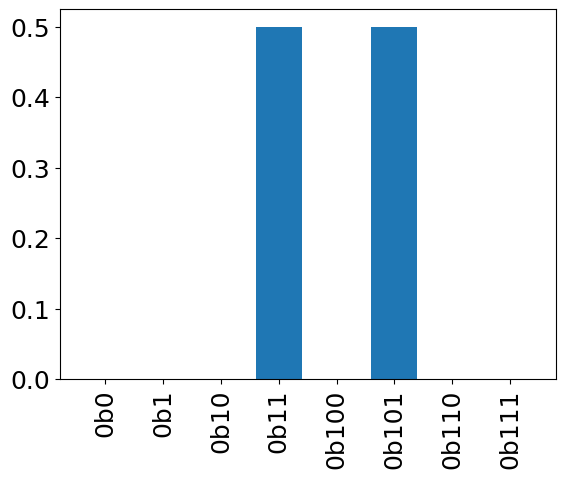

In [131]:
nqubits = 3
state = QuantumState(nqubits) #量子ビットの状態確保
state.set_zero_state() #状態をすべてゼロに初期化
print(state.get_vector()) #状態の情報を取得

X(0).update_quantum_state(state) #0番目の量子ビットにXを作用させ状態をアップデート
print(state.get_vector())

gate = X(1) #1番目の量子ビットに作用するX演算を生成
gate.update_quantum_state(state) #生成した演算を作用させて状態をアップデート
print(state.get_vector())

H(2).update_quantum_state(state) #2番目の量子ビットにHを作用させ状態をアップデート
print(state.get_vector())

CNOT(2,1).update_quantum_state(state) #2番目から1番目の量子ビットへのCNOTを作用させ状態をアップデート
show_distribution(state)

### 量子回路の構成
上で説明したように、各演算ごとに実行して量子状態を更新することもできるが、複雑な量子回路を構成する場合には、実行する前に量子回路を構成できると便利であろう。qulacsでは、`QuantumCircuit`クラスを用いて、演算の集合からなる回路`circuit`を定義することができる。定義した回路をprintすると、構成された回路の詳細データを得ることができる。

In [132]:
from qulacs import QuantumCircuit
nqubits = 2
state = QuantumState(nqubits)
state.set_zero_state()
circuit = QuantumCircuit(nqubits)
print(circuit)

*** Quantum Circuit Info ***
# of qubit: 2
# of step : 0
# of gate : 0
Clifford  : yes
Gaussian  : yes




回路への、演算の追加は、以下のような方法で行うことができる。

In [133]:
circuit.add_H_gate(0) # 0番目の量子ビットに作用するHを追加
circuit.add_gate(H(1)) # 1番目の量子ビットに作用するHを追加
circuit.add_gate(CNOT(0,1))
print(circuit)

*** Quantum Circuit Info ***
# of qubit: 2
# of step : 2
# of gate : 3
# of 1 qubit gate: 2
# of 2 qubit gate: 1
Clifford  : yes
Gaussian  : no




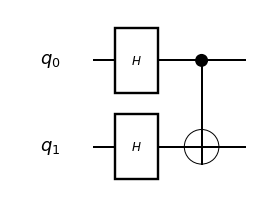

In [134]:
from qulacsvis import circuit_drawer
circuit_drawer(circuit, "mpl")

### Qulacsの計算速度を体感
一通り、導入が終わったので、qulacsの実行速度を計測してみよう。まずは、一量子ビットの実行時間を計測してみる。

In [98]:
import time

for i in range(21):
    nqubits = i+5
    state = QuantumState(nqubits)
    state.set_zero_state()
    circuit = QuantumCircuit(nqubits)
    for j in range(nqubits):
        circuit.add_gate(H(j)) #全部の量子ビットにHを作用させる回路を構成
    
    count = 0
    
    #計測スタート
    start = time.time()
    while time.time() - start < 1:
        count = count+1
        circuit.update_quantum_state(state)
    elapsed_time = (time.time() - start)/(count*nqubits)
    #計測終了
    
    print ("number of qubit:{0}".format(nqubits)+" time:{0}".format(elapsed_time) + "[sec]")

number of qubit:5 time:8.242137515943385e-08[sec]
number of qubit:6 time:8.001495319445298e-08[sec]
number of qubit:7 time:8.777073651672528e-08[sec]
number of qubit:8 time:1.0919653191814627e-07[sec]
number of qubit:9 time:1.7024234036592134e-07[sec]
number of qubit:10 time:2.8901650573264237e-07[sec]
number of qubit:11 time:5.318090587926404e-07[sec]
number of qubit:12 time:1.0214533152483317e-06[sec]
number of qubit:13 time:2.064234549291848e-06[sec]
number of qubit:14 time:5.041674528331961e-06[sec]
number of qubit:15 time:9.964687469228527e-06[sec]
number of qubit:16 time:2.0069099161445043e-05[sec]
number of qubit:17 time:3.975620330422406e-05[sec]
number of qubit:18 time:8.194114840722249e-05[sec]
number of qubit:19 time:0.00017042908061811615[sec]
number of qubit:20 time:0.0006191408192669904[sec]
number of qubit:21 time:0.0009212345430702517[sec]
number of qubit:22 time:0.0017558548833940413[sec]
number of qubit:23 time:0.0037711919217869854[sec]
number of qubit:24 time:0.0078

## ■ 量子アニーリング

ハミルトニアン（`Observable`）を定義するための関数を用意しておきます。

In [137]:
import random
from qulacs.gate import NoisyEvolution

#相互作用する量子ビットのペアとその結合定数のリストからイジング相互作用を作る
def add_ZZ_interactions(operator,ListOfInt,ListOfJij):
    nqubits = operator.get_qubit_count()
    
    for k in range(len(ListOfInt)):
        operator.add_operator(ListOfJij[k],"Z {0}".format(ListOfInt[k][0])+"Z {0}".format(ListOfInt[k][1]))
    return operator

#全ての量子ビットに対する横磁場項を定義する
def add_X_fields(operator,field):
    nqubits = operator.get_qubit_count()
    for k in range(nqubits):
        operator.add_operator(-1.0*field,"X {0}".format(k)) 
    return operator

# ビット列を整数で表したものから、index 番目のビット値から+1 or -1のスピンの値を返す
def spin_value(spin_state,index):
    return (1-2.0*((spin_state >> index)&1))

# ビット列を整数で表したものから、イジング模型のエネルギーを計算する
def cost(spin_state, ListOfInt,ListOfJij,nqubits):
    cost = 0
    for i in range(len(ListOfInt)):
        cost += ListOfJij[i]*spin_value(spin_state,ListOfInt[i][0])*spin_value(spin_state,ListOfInt[i][1])
    return cost


量子アニーリングを実行する関数

In [141]:
# 量子ビット数 nqubits、イジング模型を定義する相互作用情報のリスト ListOfInt,ListOfJij、
# アニーリングステップ数 anneal_steps、アニーリングのスケジュール schedule、終状態からのサンプリング回数 num_samples
def quantum_annealing(nqubits,ListOfInt,ListOfJij,anneal_steps,schedule,num_samples):
    
    #各時刻のハミルトニアンを定義する
    hamiltonian = [Observable(nqubits) for i in range(anneal_steps)]
    for i in range(anneal_steps):
        hamiltonian[i] = add_ZZ_interactions(hamiltonian[i],ListOfInt,(1-schedule[i])*ListOfJij)
        hamiltonian[i] = add_X_fields(hamiltonian[i],schedule[i])

#    for _ in tqdm.tqdm(range(num_samples)):
    state = QuantumState(nqubits)
    #初期状態は全ての量子ビットにアダマールゲートを作用させ、すべて|+>の状態（全てのビット列の重ね合わせ状態）
    for i in range(nqubits):
        H(i).update_quantum_state(state)

    for i in range(annealing_step):
        noisy_operation = NoisyEvolution(hamiltonian[i],[],dt,dt)    
        noisy_operation.update_quantum_state(state)

    return state.sampling(num_samples)

イジング模型の結合定数を定義

In [142]:
nqubits = 10
num_samples=100
annealing_step = 1000
dt = 0.01 #シミュレーションの時間間隔

ListOfInt = [[i,j] for i in range(nqubits) for j in range(i)]
#ランダムにイジング模型を定義
ListOfJij = np.array([(-1)**random.randint(0,1) for i in range(len(ListOfInt))])

全探索して、全ての配位に対してコストの値を表示。


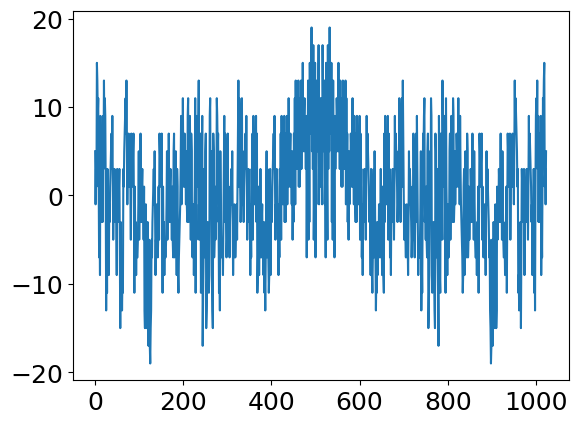

In [143]:
answer = [cost(i,ListOfInt,ListOfJij,nqubits) for i in range(2**nqubits)]
plt.plot(answer)

量子アニーリングによるサンプリング

In [144]:

#アニーリングのスケジュール
anneal_steps = 1000
schedule = [1-i*(1/anneal_steps) for i in range(anneal_steps)]  

res = quantum_annealing(nqubits,ListOfInt,ListOfJij,anneal_steps,schedule,num_samples)

サンプリング結果のヒストグラムをコストの値と重ねてプロット

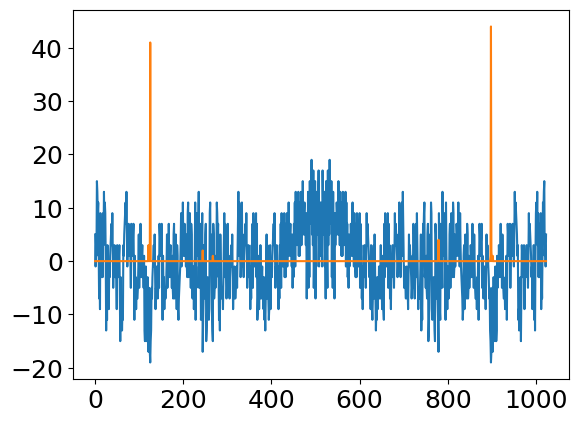

In [145]:
answer = [cost(i,ListOfInt,ListOfJij,nqubits) for i in range(2**nqubits)]
histgram = np.zeros(2**nqubits)

#サンプリングで得られた解からヒストグラムを作る
for i in range(len(res)):
    histgram[res[i]] += 1
    
plt.plot(answer)
plt.plot(histgram)
plt.show()

In [148]:
nqubits = 14
num_samples=100
annealing_step = 1000
dt = 0.01 #シミュレーションの時間間隔

ListOfInt = [[i,j] for i in range(nqubits) for j in range(i)]
#ランダムにイジング模型を定義
ListOfJij = np.array([(-1)**random.randint(0,1) for i in range(len(ListOfInt))])


#アニーリングのスケジュール
anneal_steps = 1000
schedule = [1-i*(1/anneal_steps) for i in range(anneal_steps)]  

res = quantum_annealing(nqubits,ListOfInt,ListOfJij,anneal_steps,schedule,num_samples)

## ■ QAOA（Quantum approximated optimization)

量子アニーリングでは断熱的に計算を実行するために時間に依存したハミルトニアンによる時間発展をシミュレーションするために、微小時間発展（$\Delta t$ごとの時間発展）をシミュレーションする必要があり、ステップ数が多くなってしまいます。QAOAは、断熱条件を外し、少ないステップ数の計算でイジング模型からのサンプリングを実行するアルゴリズムです。


In [149]:
#index番目のビット値からスピン+1, -1に変換
def bitstring_to_spin_val(bitstring,index):
    return (1-2.0*((bitstring >> index)&1))

#イジング模型のコスト（エネルギー）を計算
def Ising_cost(bitstring,Ising_couplings,z_fields):
    hamiltonian = 0
    for i in range(len(Ising_couplings)):
        hamiltonian += Ising_couplings[i][1]* bitstring_to_spin_val(bitstring,Ising_couplings[i][0][0])*bitstring_to_spin_val(bitstring,Ising_couplings[i][0][1])
        
    for i in range(len(z_fields)):
        hamiltonian += z_fields[i][1]*bitstring_to_spin_val(bitstring,z_fields[i][0])
        
    return hamiltonian

#イジングハミルトニアンの定義
def define_Ising_hamiltonian(operator,Ising_couplings,z_fields):
    nqubits = operator.get_qubit_count()
    
    for k in range(len(Ising_couplings)):
        if Ising_couplings[k][1] !=0:
            operator.add_operator(Ising_couplings[k][1],"Z {0}".format(Ising_couplings[k][0][0])+"Z {0}".format(Ising_couplings[k][0][1]))

    for k in range(len(z_fields)):
        if z_fields[k][1] !=0:
            operator.add_operator(z_fields[k][1],"Z {0}".format(z_fields[k][0]))

    return operator

#横磁場項の追加
def add_X_fields(operator):
    nqubits = operator.get_qubit_count()
    for k in range(nqubits):
        operator.add_operator(1.0,"X {0}".format(k)) 
    return operator


### イジングモデルの係数から qulacs.Observable としてHamiltonian を構築する

In [150]:
nqubits = 5

#例として全結合のランダムなイジング模型を作る
Ising_couplings= [[[i,j], random.randint(-1,1)] for i in range(nqubits) for j in range(i)]
z_fields = [[i, random.randint(-1,1)] for i in range(nqubits)]

In [151]:
Ising_hamiltonian = Observable(nqubits)
define_Ising_hamiltonian(Ising_hamiltonian,Ising_couplings,z_fields)
show_observable(Ising_hamiltonian)

(1+0j) Z1 Z0
(1+0j) Z2 Z1
(1+0j) Z3 Z0
(-1+0j) Z3 Z1
(1+0j) Z4 Z0
(-1+0j) Z4 Z1
(1+0j) Z4 Z3
(-1+0j) Z0
(1+0j) Z1


In [152]:
driver_hamiltonian = Observable(nqubits)
driver_hamiltonian = add_X_fields(driver_hamiltonian)
show_observable(driver_hamiltonian)

(1+0j) X0
(1+0j) X1
(1+0j) X2
(1+0j) X3
(1+0j) X4


### QAOAのための量子回路を定義する

In [156]:
# QAOA量子回路の定義、問題ハミルトニアン、横磁場項のそれぞれの回転角をパラメータとして与える
def define_QAOA_ansatz(parameter_list,Ising_hamiltonian,driver_hamiltonian,num_layers):
        nqubits = Ising_hamiltonian.get_qubit_count()
        circuit=QuantumCircuit(nqubits)
        for i in range(num_layers):
            circuit.add_observable_rotation_gate(Ising_hamiltonian,parameter_list[2*i],1)
            circuit.add_observable_rotation_gate(driver_hamiltonian,parameter_list[2*i+1],1)
        return circuit    
    
#ハミルトニアンの期待値（イジング模型のエネルギーの期待値）を計算
def cost_QAOA(parameter_list,Ising_hamiltonian,driver_hamiltonian,num_layers):
    nqubits = Ising_hamiltonian.get_qubit_count()
    state = QuantumState(nqubits)
    
    for i in range(nqubits):
        H(i).update_quantum_state(state)
    define_QAOA_ansatz(parameter_list,Ising_hamiltonian,driver_hamiltonian,num_layers).update_quantum_state(state)
    return Ising_hamiltonian.get_expectation_value(state)

#QAOA回路からサンプリング
def sampling_QAOA(parameter_list,Ising_hamiltonian,driver_hamiltonian,num_layers,num_sample):
    nqubits = Ising_hamiltonian.get_qubit_count()
    state = QuantumState(nqubits)
    
    for i in range(nqubits):
        H(i).update_quantum_state(state)
    define_QAOA_ansatz(parameter_list,Ising_hamiltonian,driver_hamiltonian,num_layers).update_quantum_state(state)
    return state.sampling(num_sample)

### QAOAを実行してみる

In [157]:
#問題を定義する部分
nqubits =10

#例として全結合のランダムなイジング模型を作る
Ising_couplings= [[[i,j], random.randint(-1,1)] for i in range(nqubits) for j in range(i)]
z_fields = [[i, random.randint(-1,1)] for i in range(nqubits)]

#イジング問題の定義
Ising_hamiltonian = Observable(nqubits)
Ising_hamiltonian = define_Ising_hamiltonian(Ising_hamiltonian,Ising_couplings,z_fields)

In [158]:
show_observable(Ising_hamiltonian)

(1+0j) Z1 Z0
(1+0j) Z2 Z1
(1+0j) Z3 Z2
(1+0j) Z4 Z2
(1+0j) Z4 Z3
(-1+0j) Z5 Z0
(1+0j) Z5 Z1
(-1+0j) Z5 Z2
(1+0j) Z5 Z4
(1+0j) Z6 Z0
(1+0j) Z6 Z2
(1+0j) Z6 Z3
(1+0j) Z6 Z4
(-1+0j) Z6 Z5
(-1+0j) Z7 Z0
(1+0j) Z7 Z1
(-1+0j) Z7 Z2
(-1+0j) Z7 Z6
(1+0j) Z8 Z0
(-1+0j) Z8 Z1
(1+0j) Z8 Z2
(-1+0j) Z8 Z3
(-1+0j) Z8 Z4
(1+0j) Z8 Z5
(1+0j) Z8 Z6
(-1+0j) Z8 Z7
(-1+0j) Z9 Z0
(-1+0j) Z9 Z2
(-1+0j) Z9 Z4
(-1+0j) Z9 Z5
(1+0j) Z9 Z6
(1+0j) Z9 Z7
(-1+0j) Z0
(-1+0j) Z1
(1+0j) Z2
(1+0j) Z3
(-1+0j) Z8
(1+0j) Z9


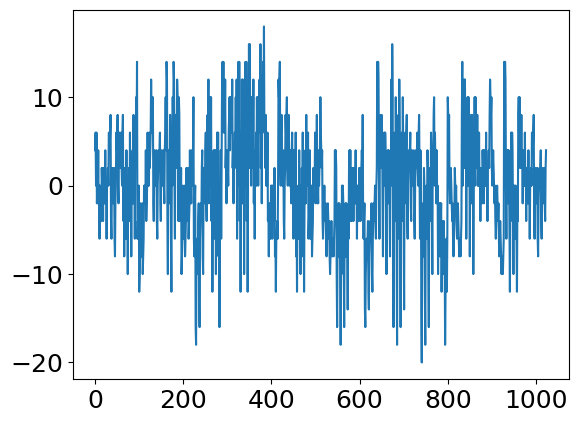

In [159]:
#エネルギーランドスケープを見ておく
plt.plot([Ising_cost(i,Ising_couplings,z_fields) for i in range(1 << nqubits)])

Optimization terminated successfully.
         Current function value: -16.847277
         Iterations: 19
         Function evaluations: 264
         Gradient evaluations: 24


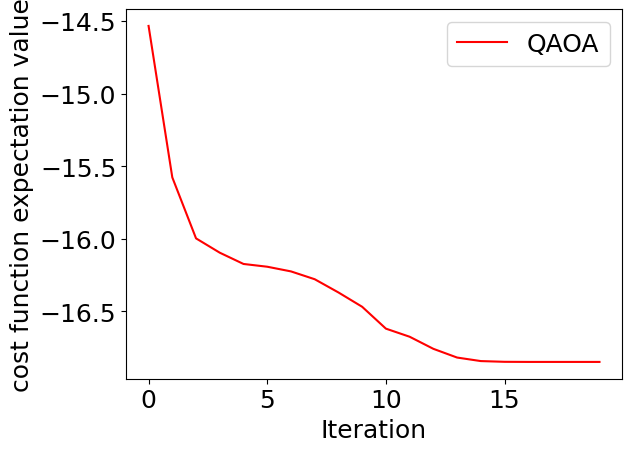

In [160]:
import scipy.optimize

#レイヤー数
layer = 5

#driverハミルトニアンの定義
driver_hamiltonian = Observable(nqubits)
driver_hamiltonian = add_X_fields(driver_hamiltonian)

def cost(parameter_list):
    return cost_QAOA(parameter_list,Ising_hamiltonian,driver_hamiltonian,layer)

    
cost_history = []

# 黒魔術で初期パラメータを決めておく（かなり良い初期値からスタートできる）
alpha_Ising = 0.3
alpha_z = 1.2

bias_Ising= 0.2
bias_z = 1.5

gamma = [-bias_Ising- (alpha_Ising/layer)*i for i in range(layer)]
beta = [bias_z - (alpha_z/layer) * i for i in range(layer)]
init_theta_list = []
for i in range(layer):
    init_theta_list.append(gamma[i])
    init_theta_list.append(beta[i])
    
    

#init_theta_list = [random.random() for i in range(layer*2)]


cost_history.append(cost(init_theta_list))
method = "BFGS"
options = {"disp": True, "maxiter": 200, "gtol": 1e-3}


opt = scipy.optimize.minimize(cost, init_theta_list,
               method=method,
               callback=lambda x: cost_history.append(cost(x)),options = options)

plt.rcParams["font.size"] = 18
plt.plot(cost_history, color="red", label="QAOA")
plt.xlabel("Iteration")
plt.ylabel("cost function expectation value")
plt.legend()
plt.show()


In [162]:
res = sampling_QAOA(opt.x,Ising_hamiltonian,driver_hamiltonian,layer,10)
print([Ising_cost(res[i],Ising_couplings,z_fields) for i in range(len(res))])

[-20.0, -18.0, -18.0, -14.0, -18.0, -16.0, -18.0, -16.0, -18.0, -14.0]


In [163]:
min([Ising_cost(res[i],Ising_couplings,z_fields) for i in range(len(res))])

-20.0

問題のインスタンスが変わっても、上記で最適化したパラメータは再利用可能

In [165]:
learned_parameter = opt.x

In [176]:
#問題を定義する部分
nqubits =12

#例として全結合のランダムなイジング模型を作る
Ising_couplings= [[[i,j], random.random()] for i in range(nqubits) for j in range(i)]
z_fields = [[i, random.randint(-1,1)] for i in range(nqubits)]

#イジング問題の定義
Ising_hamiltonian = Observable(nqubits)
Ising_hamiltonian = define_Ising_hamiltonian(Ising_hamiltonian,Ising_couplings,z_fields)

#レイヤー数
layer = 5

#driverハミルトニアンの定義
driver_hamiltonian = Observable(nqubits)
driver_hamiltonian = add_X_fields(driver_hamiltonian)
res = sampling_QAOA(learned_parameter,Ising_hamiltonian,driver_hamiltonian,layer,100)

In [175]:
print("QAOA:",min([Ising_cost(res[i],Ising_couplings,z_fields) for i in range(len(res))]))
print("Exact:",min([Ising_cost(i,Ising_couplings,z_fields) for i in range(1 << nqubits)]))

QAOA: -12.002971517792012
Exact: -12.002971517792012


上記の、アルゴリズムはヒューリスティック（性能が保証されない近似手法）であるが、グローバー探索アルゴリズム[https://github.com/keisukefujii/QulacsExamples/blob/master/GroverSearch.ipynb]を用いると計算の加速が保証された、グローバー適応探索を実行することも可能です。

## ■課題
- 1000回ずつサンプリングしたうち最適解が得られている割合を計算せよ。
- 量子ビットの数を10から20程度まで（数値計算の時間がかかる場合は、16や18などでもOK）増やしていったときに、最適解が得られている割合を量子ビット数に対してプロットせよ。